# OCR для медицинских справок

**Цель работы** — спроектировать решение для распознавания табличной информации с фотографий медицинских справок (перечень донаций крови конкретным донором) и проверить гипотезу о предполагаемом качестве выбранного метода. Обязательно распознать нужно следующие поля:

* Дата донации (дд.мм.гггг)
* Вид донации (класс крови):
    * пл/д и п/ф — плазма
    * кр/д, к/д и ц/д — цельная кровь
    * т/ф — тромбоциты
* Оплачивалась ли донору донация:
    * бв — безвозмездно
    * плат — платно

Гипотезу сформулируем следующую: "Считаемая по отдельным ячейкам таблицы *accuracy* выбранного метода в среднем по всем тестовым примерам будет не ниже 0.75".

Для тестирования решения заказчиком предоставлены непосредственно фото справок и *ground truth* в csv-файлах.

**Ход работы**

Выберем готовый метод для OCR, взглянем на пример предоставленных данных, рассмотрим "сырой" результат работы выбранного метода.

Создадим функцию для формирования csv-файла с предсказанной таблицей и взглянем на получившийся итог для одного тестового примера.

Далее протестируем решение на всех тестовых примерах, рассчитаем *accuracy* для каждого в отдельности, а также общий итоговый показатель метрики, что и даст нам возможность определиться с результатом проверки гипотезы.
 
Таким образом работа будет состоять из следующих этапов:

* Получение непосредственного результата работы выбранного метода
* Создание и проверка решения для формирования предсказания
* Тестирование решения и проверка гипотезы

## Получение непосредственного результата работы выбранного метода

In [1]:
import os
import re

import pandas as pd
import plotly.express as px

from doctr.io import DocumentFile
from doctr.models import ocr_predictor

home = 'C:\\Users\\darve\\Pet_projects\\405\\'

Запустим решение и взглянем на результат его работы и пример предоставленных данных.

In [2]:
model = ocr_predictor(
    pretrained=True,
    det_arch='db_resnet50',
    reco_arch='crnn_mobilenet_v3_small'
    )
doc_1 = DocumentFile.from_images(os.path.join(home, '228963.jpg'))
result_1 = model(doc_1)
doc_2 = DocumentFile.from_images(os.path.join(home, '141899.jpg'))
result_2 = model(doc_2)

c:\ProgramData\Anaconda3\envs\practicum\lib\site-packages\torchvision\models\_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
c:\ProgramData\Anaconda3\envs\practicum\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
c:\ProgramData\Anaconda3\envs\practicum\lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=No

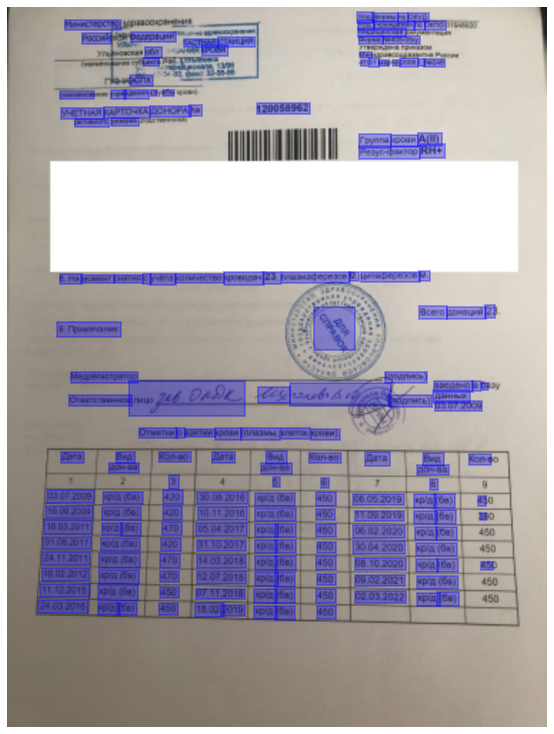

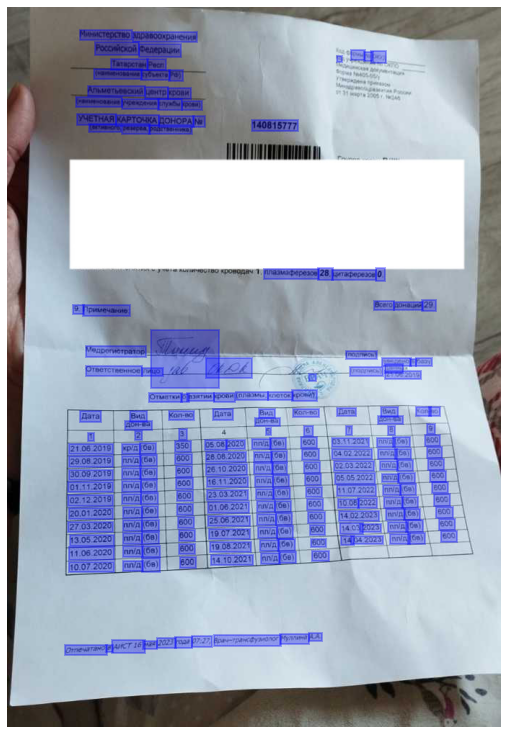

In [3]:
result_1.show(doc_1)
result_2.show(doc_2)

In [4]:
df_1 = pd.read_csv(os.path.join(home, '228963.csv'))
df_2 = pd.read_csv(os.path.join(home, '141899.csv'))
display(df_1, df_2)

,ID,ID пользователя,Класс крови,Дата донации,Дата добавления донации,Тип донации,Регион,Место стадчи,Статус донации,Есть справка
0,215146,228963,Цельная кровь,03.07.2009,25.05.2023,Безвозмездно,"Россия, Ульяновская область, Ульяновск",563,Принята,Да
1,215147,228963,Цельная кровь,16.09.2009,25.05.2023,Безвозмездно,"Россия, Ульяновская область, Ульяновск",563,Принята,Да
2,215148,228963,Цельная кровь,16.03.2011,25.05.2023,Безвозмездно,"Россия, Ульяновская область, Ульяновск",563,Принята,Да
3,215149,228963,Цельная кровь,01.08.2011,25.05.2023,Безвозмездно,"Россия, Ульяновская область, Ульяновск",563,Принята,Да
4,215150,228963,Цельная кровь,24.11.2011,25.05.2023,Безвозмездно,"Россия, Ульяновская область, Ульяновск",563,Принята,Да
5,215151,228963,Цельная кровь,16.02.2012,25.05.2023,Безвозмездно,"Россия, Ульяновская область, Ульяновск",563,Принята,Да
6,215152,228963,Цельная кровь,11.12.2015,25.05.2023,Безвозмездно,"Россия, Ульяновская область, Ульяновск",563,Принята,Да
7,215153,228963,Цельная кровь,24.03.2016,25.05.2023,Безвозмездно,"Россия, Ульяновская область, Ульяновск",563,Принята,Да
8,215154,228963,Цельная кровь,30.08.2016,25.05.2023,Безвозмездно,"Россия, Ульяновская область, Ульяновск",563,Принята,Да
9,215155,228963,Цельная кровь,10.11.2016,25.05.2023,Безвозмездно,"Россия, Ульяновская область, Ульяновск",563,Принята,Да


,ID,ID пользователя,Класс крови,Дата донации,Дата добавления донации,Тип донации,Регион,Место стадчи,Статус донации,Есть справка
0,87330,141899,Цельная кровь,21.06.2019,18.11.2020,Безвозмездно,"Россия, Татарстан, Альметьевск",703,Принята,Да
1,213527,141899,Плазма,29.08.2019,16.05.2023,Безвозмездно,"Россия, Татарстан, Альметьевск",703,Принята,Да
2,213528,141899,Плазма,30.09.2019,16.05.2023,Безвозмездно,"Россия, Татарстан, Альметьевск",703,Принята,Да
3,213529,141899,Плазма,01.11.2019,16.05.2023,Безвозмездно,"Россия, Татарстан, Альметьевск",703,Принята,Да
4,213530,141899,Плазма,02.12.2019,16.05.2023,Безвозмездно,"Россия, Татарстан, Альметьевск",703,Принята,Да
5,213713,141899,Плазма,20.01.2020,17.05.2023,Безвозмездно,"Россия, Татарстан, Альметьевск",703,Принята,Да
6,213725,141899,Плазма,27.03.2020,17.05.2023,Безвозмездно,"Россия, Татарстан, Альметьевск",703,Принята,Да
7,213718,141899,Плазма,13.05.2020,17.05.2023,Безвозмездно,"Россия, Татарстан, Альметьевск",703,Принята,Да
8,213719,141899,Плазма,11.06.2020,17.05.2023,Безвозмездно,"Россия, Татарстан, Альметьевск",703,Принята,Да
9,213720,141899,Плазма,10.07.2020,17.05.2023,Безвозмездно,"Россия, Татарстан, Альметьевск",703,Принята,Да


In [5]:
print(result_1.pages[0].blocks[25:29])

[Block(
  (lines): [Line(
    (words): [Word(value='Aara', confidence=0.54)]
  )]
  (artefacts): []
), Block(
  (lines): [
    Line(
      (words): [Word(value='Bun', confidence=0.75)]
    ),
    Line(
      (words): [Word(value='noaa', confidence=0.39)]
    ),
    Line(
      (words): [Word(value='8', confidence=0.59)]
    ),
  ]
  (artefacts): []
), Block(
  (lines): [
    Line(
      (words): [Word(value='Kon-e', confidence=0.68)]
    ),
    Line(
      (words): [Word(value='4', confidence=0.91)]
    ),
    Line(
      (words): [Word(value='JE', confidence=0.87)]
    ),
  ]
  (artefacts): []
), Block(
  (lines): [
    Line(
      (words): [
        Word(value='030/.2009', confidence=0.53),
        Word(value='pAica)', confidence=0.21),
      ]
    ),
    Line(
      (words): [
        Word(value='16.002009', confidence=0.74),
        Word(value='paa)', confidence=0.34),
      ]
    ),
    Line(
      (words): [
        Word(value='16.03.2011', confidence=0.85),
        Word(value='p

In [6]:
print(result_2.pages[0].blocks[25:29])

[Block(
  (lines): [Line(
    (words): [
      Word(value='14.10.2021', confidence=0.87),
      Word(value='nnA', confidence=0.39),
      Word(value='(Ge)', confidence=0.9),
      Word(value='600', confidence=0.78),
    ]
  )]
  (artefacts): []
), Block(
  (lines): [Line(
    (words): [Word(value='600', confidence=0.96)]
  )]
  (artefacts): []
), Block(
  (lines): [Line(
    (words): [
      Word(value='Nae', confidence=0.4),
      Word(value='2023', confidence=0.99),
      Word(value='roaa', confidence=0.19),
      Word(value='07:27,', confidence=0.52),
      Word(value='Aer-rpaheo@yaesnor', confidence=0.2),
      Word(value='Mynnumsa', confidence=0.37),
      Word(value='AA', confidence=1.0),
    ]
  )]
  (artefacts): []
), Block(
  (lines): [Line(
    (words): [
      Word(value='Omnewarano', confidence=0.43),
      Word(value='a', confidence=0.9),
      Word(value='AICT16', confidence=0.51),
    ]
  )]
  (artefacts): []
)]


**Промежуточные выводы**

В предоставленных датасетах есть вся нужная для проверки информация — колонки **Дата донации**, **Класс крови** и **Тип донации**.

Имеющиеся фото могут быть достаточно нечёткиим, с неравномерным освещением, повёрнутыми и несколько сложенными, но видно, что метод достаточно хорошо находит нужные блоки с текстом.

На выходе получается вложенная структура, состоящая из блоков, строк и слов, но формируются они достаточно хаотично.

## Создание и проверка решения для формирования предсказания

Учитывая нестаблильно формирующиеся блоки получаемой методом структуры, создадим общий список всех найденных "слов" в документе, по которому будем далее проходиться в созданной функции и формировать итоговый датасет по определённым закономерностям.

In [7]:
# экспорт в JSON
jsn = result_1.pages[0].export()

lst = []
for b in jsn['blocks']:
    for l in b['lines']:
        for w in l['words']:
            lst.append(w['value'])

In [8]:
def table_assembly(lst):
    # проходим по всем элементам списка и формируем переменные
    # для заполнения значений таблицы
    df = pd.DataFrame(columns=['date', 'donation_type', 'is_paid'])
    i = 0
    while i < len(lst):
        date = None
        donation_type = None
        is_paid = None
        
        # следующие четыре блока для заполнения переменных
        # с помощью regexp учитывают возможные варианты
        # распознавания методом дат, классов крови, оплаты
        # и то, что оставшиеся нужные значения
        # чаще всего идут сразу после элемента с датой
        if re.match(
            r'^[^\w\s\(\)]*\d{2}[^\w\s\(\)]*\d{2}[\W_]*(\d{2}|\d{4})[\W_]*$',
            lst[i]
            ) and i+2 < len(lst) and re.match(
                r'^\w{1,2}[\W_]?\w{,2}[\W_]?\w{,4}[\W_]?$',
                lst[i+1]
                ):
            date_parts = re.findall(r'(\d{2})[\W_]*(\d{2})', lst[i])[0]
            year = '20' + re.findall(r'(\d{2})', lst[i])[-1]
            date = f'{date_parts[0]}.{date_parts[1]}.{year}'
            if re.match(r'^\w{1,2}[\W_]?\w{,2}[\W_]?\w{,4}[\W_]$', lst[i+1]):
                donation_type = re.findall(
                    r'\w{1,2}[\W_]?\w{,2}',
                    lst[i+1]
                    )[0].lower()
                is_paid = re.findall(
                    r'[\W_]?\w{,4}[\W_]$',
                    lst[i+1]
                    )[0].lower()
                i += 2
            elif re.match(r'^[\W_]?\w{1,4}[\W_]?$', lst[i+2]):
                donation_type = lst[i+1].lower()
                is_paid = lst[i+2].lower()
                i += 3
            else:
                date = None

        elif re.match(r'^[^\w\s\(\)]*\d{2}[^\w\s\(\)]*$', lst[i]) \
          and i+3 < len(lst) \
          and re.match(r'^[\W_]*\d{2}[\W_]*(\d{2}|\d{4})[\W_]*$', lst[i+1]) \
          and re.match(r'^\w{1,2}[\W_]?\w{,2}[\W_]?\w{,4}[\W_]?$', lst[i+2]):
            date_parts = re.findall(r'(\d{2})[\W_]*(\d{2})',lst[i]+lst[i+1])[0]
            year = '20' + re.findall(r'(\d{2})', lst[i+1])[-1]
            date = f'{date_parts[0]}.{date_parts[1]}.{year}'
            if re.match(r'^\w{1,2}[\W_]?\w{,2}[\W_]?\w{,4}[\W_]$', lst[i+2]):
                donation_type = re.findall(
                    r'\w{1,2}[\W_]?\w{,2}',
                    lst[i+2]
                    )[0].lower()
                is_paid = re.findall(
                    r'[\W_]?\w{,4}[\W_]$',
                    lst[i+2]
                    )[0].lower()
                i += 3
            elif re.match(r'^[\W_]?\w{1,4}[\W_]?$', lst[i+3]):
                donation_type = lst[i+2].lower()
                is_paid = lst[i+3].lower()
                i += 4
            else:
                date = None

        elif re.match(r'^[^\w\s\(\)]*\d{2}[^\w\s\(\)]*\d{2}[\W_]*$', lst[i]) \
          and i+3 < len(lst) \
          and re.match(r'^[\W_]*(\d{2}|\d{4})[\W_]*$', lst[i+1]) \
          and re.match(r'^\w{1,2}[\W_]?\w{,2}[\W_]?\w{,4}[\W_]?$', lst[i+2]):
            date_parts = re.findall(r'(\d{2})[\W_]*(\d{2})', lst[i])[0]
            year = '20' + re.findall(r'(\d{2})', lst[i+1])[-1]
            date = f'{date_parts[0]}.{date_parts[1]}.{year}'
            if re.match(r'^\w{1,2}[\W_]?\w{,2}[\W_]?\w{,4}[\W_]$', lst[i+2]):
                donation_type = re.findall(
                    r'\w{1,2}[\W_]?\w{,2}',
                    lst[i+2]
                    )[0].lower()
                is_paid = re.findall(
                    r'[\W_]?\w{,4}[\W_]$',
                    lst[i+2]
                    )[0].lower()
                i += 3
            elif re.match(r'^[\W_]?\w{1,4}[\W_]?$', lst[i+3]):
                donation_type = lst[i+2].lower()
                is_paid = lst[i+3].lower()
                i += 4
            else:
                date = None

        elif re.match(r'^[^\w\s\(\)]*\d{2}[^\w\s\(\)]*$', lst[i]) \
          and i+4 < len(lst) \
          and re.match(r'^[\W_]*\d{2}[\W_]*$', lst[i+1]) \
          and re.match(r'^[\W_]*(\d{2}|\d{4})[\W_]*$', lst[i+2]) \
          and re.match(r'^\w{1,2}[\W_]?\w{,2}[\W_]?\w{,4}[\W_]?$', lst[i+3]):
            date_parts = re.findall(r'(\d{2})[\W_]*(\d{2})',lst[i]+lst[i+1])[0]
            year = '20' + re.findall(r'(\d{2})', lst[i+2])[-1]
            date = f'{date_parts[0]}.{date_parts[1]}.{year}'
            if re.match(r'^\w{1,2}[\W_]?\w{,2}[\W_]?\w{,4}[\W_]$', lst[i+3]):
                donation_type = re.findall(
                    r'\w{1,2}[\W_]?\w{,2}',
                    lst[i+3]
                    )[0].lower()
                is_paid = re.findall(
                    r'[\W_]?\w{,4}[\W_]$',
                    lst[i+3]
                    )[0].lower()
                i += 4
            elif re.match(r'^[\W_]?\w{1,4}[\W_]?$', lst[i+4]):
                donation_type = lst[i+3].lower()
                is_paid = lst[i+4].lower()
                i += 5
            else:
                date = None
        
        # этот блок формирует значение класса крови на основании
        # закономерностей распознавания методом русских букв в
        # используемых сокращениях как соответствующих латинских
        if donation_type:
            if 't' in donation_type:
                donation_type = 'Тромбоциты'
            elif 'k' in donation_type \
              or 'w' in donation_type \
              or 'p' in donation_type:
                donation_type = 'Цельная кровь'
            elif 'n' in donation_type \
              or 'm' in donation_type \
              or 'v' in donation_type:
                donation_type = 'Плазма'
            elif re.search(r'[a-z]', donation_type) \
              or len(re.findall(r'\d', donation_type)) < 2:
                donation_type = None
        
        # факт оплаты формируется на основании закономерностей
        # длины и буквенно-числового состава распознанных элементов
        if is_paid:
            if 0 < len(re.findall(r'[a-z0-9]', is_paid)) < 3:
                is_paid = 'Безвозмездно'
            elif 2 < len(re.findall(r'[a-z0-9]', is_paid)) < 5 \
              and ('n' in is_paid or 't' in is_paid):
                is_paid = 'Платно'
            elif len(re.findall(r'[a-z0-9]', is_paid)) > 14 \
              or len(re.findall(r'[a-z0-9]', is_paid)) == 0 \
              or len(re.findall(r'\d', is_paid)) < 6:
                is_paid = None
        
        # если же элемент is_paid оказался в диапазоне от 5 до 14 элементов
        # и содержал как минимум 6 чисел или же элемент donation_type
        # содержал буквы или менее 2 чисел (условия выше),
        # то с большой долей этот элемент является следующей датой,
        # а текущий блок из трёх нужных значений не распознан
        # методом полностью; в таком случае нужно начать цикл распознавания
        # с новой обнаруженной даты для получения более полного блока
        if (
          re.match(r'^[^\w\s\(\)]*\d{2}[^\w\s\(\)]*$', str(is_paid)) or \
          re.match(r'^[^\w\s\(\)]*\d{2}[^\w\s\(\)]*\d{2}[\W_]*$', str(is_paid))
          ) and i+1 < len(lst) and (
          re.match(r'^[\W_]*\d{2}[\W_]*(\d{2}|\d{4})[\W_]*$', lst[i]) or \
          re.match(r'^[\W_]*(\d{2}|\d{4})[\W_]*$', lst[i])
          ):
            i -= 1
            continue

        if (
          re.match(
            r'^[^\w\s\(\)]*\d{2}[^\w\s\(\)]*\d{2}[\W_]*(\d{2}|\d{4})[\W_]*$',
            str(donation_type)
            ) or \
          re.match(
            r'^[^\w\s\(\)]*\d{2}[^\w\s\(\)]*$',
            str(donation_type)
            ) or \
          re.match(
            r'^[^\w\s\(\)]*\d{2}[^\w\s\(\)]*\d{2}[\W_]*$',
            str(donation_type)
            )
          ) and i+1 < len(lst) and (
          re.match(r'^\w{1,2}[\W_]?\w{,2}[\W_]?\w{,4}[\W_]?$', is_paid) or \
          re.match(r'^[\W_]*\d{2}[\W_]*(\d{2}|\d{4})[\W_]*$', is_paid) or \
          re.match(r'^[\W_]*(\d{2}|\d{4})[\W_]*$', is_paid)
          ):
            i -= 2
            continue

        if date:
            df.loc[len(df)] = [date, donation_type, is_paid]
        else:
            i += 1
    
    # далее удаляем строки с дубликататами дат, оставляя строку
    # с наибольшим количеством распознанных элементов
    df['non_empty_count'] = df.apply(lambda x: x.count(), axis=1)
    df = df.sort_values('non_empty_count', ascending=False)
    df = df.drop_duplicates(subset='date', keep='first')
    df = df.drop('non_empty_count', axis=1)

    # для удобства дальнейшего промотра сортируем записи по дате,
    # оставляя на месте строки с некорректно распознанной датой
    date_copy = df['date'].copy()
    df['date'] = pd.to_datetime(df['date'], format='%d.%m.%Y', errors='coerce')
    invalid_rows = df[df['date'].isna()].copy()
    invalid_rows['date'] = date_copy[df['date'].isna()]
    df = df[~df['date'].isna()]
    df = df.sort_values(by='date')
    df['date'] = df['date'].dt.strftime('%d.%m.%Y')
    for idx, row in invalid_rows.iterrows():
        df = pd.concat([df.iloc[:idx], row.to_frame().T, df.iloc[idx:]]).reset_index(drop=True)
    
    # и в конце заполняем пропущенные элементы на основе
    # соответствующих значений, наиболее часто встречающихся в тестовых примерах
    df = df.fillna(value={
        'is_paid': 'Безвозмездно',
        'donation_type': 'Цельная кровь'
        })
        
    df.columns = ['Дата донации', 'Класс крови', 'Тип донации']

    return df

Теперь получим датафрейм на основе работы функции и взглянём на него.

In [9]:
df = table_assembly(lst)
df

,Дата донации,Класс крови,Тип донации
0,16.00.2009,Цельная кровь,Безвозмездно
1,16.03.2011,Цельная кровь,Безвозмездно
2,01.08.2011,Цельная кровь,Безвозмездно
3,24.11.2011,Цельная кровь,Безвозмездно
4,15.02.2012,Цельная кровь,Безвозмездно
5,24.03.2015,Цельная кровь,Безвозмездно
6,11.12.2015,Цельная кровь,Безвозмездно
7,30.08.2016,Цельная кровь,Безвозмездно
8,10.11.2016,Цельная кровь,Безвозмездно
9,05.04.2017,Цельная кровь,Безвозмездно


**Промежуточные выводы**

Видно, что за редким исключением (16.00.2019 в строке 0, 06.00.2019 в строке 16 и 00.02.2021 в строке 21) данные распознаются корректно. Осталось проверить точность распознавания.

## Тестирование решения и проверка гипотезы

Теперь для каждого тестового примера получим *accuracy* по нужным ячейкам, взглянем на распределение всех оценок, а также вычислим общую метрику.

c:\ProgramData\Anaconda3\envs\practicum\lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Accuracy for 141899: 0.920


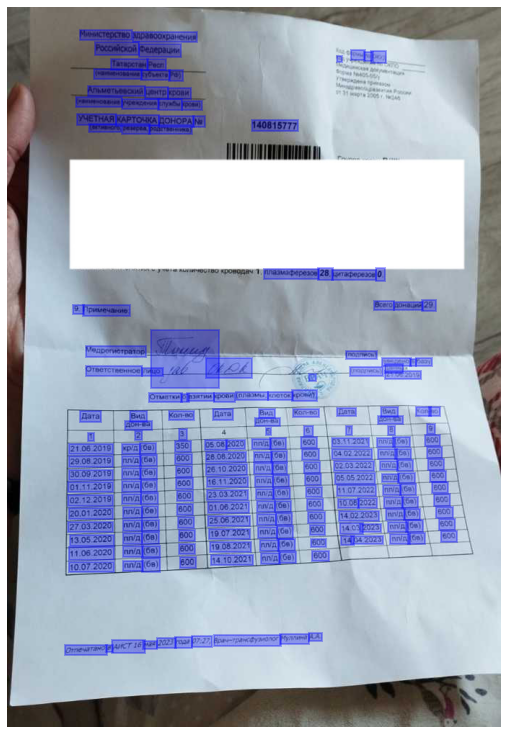


Accuracy for 204119: 1.000


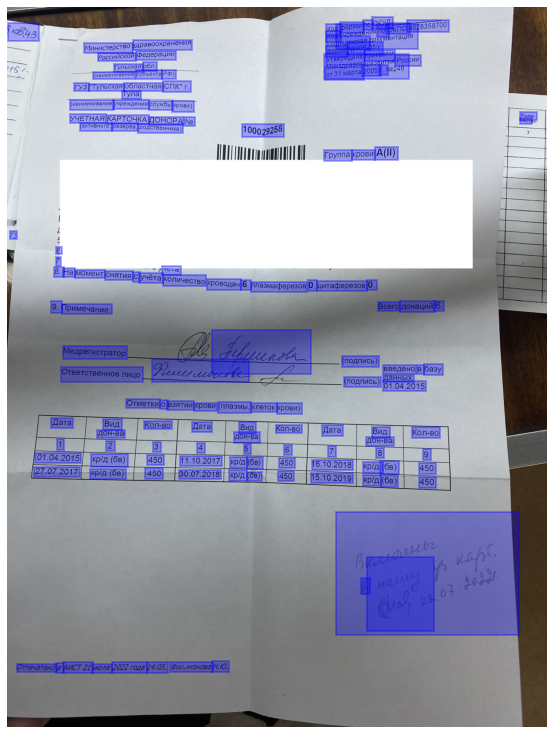


Accuracy for 213950: 1.000


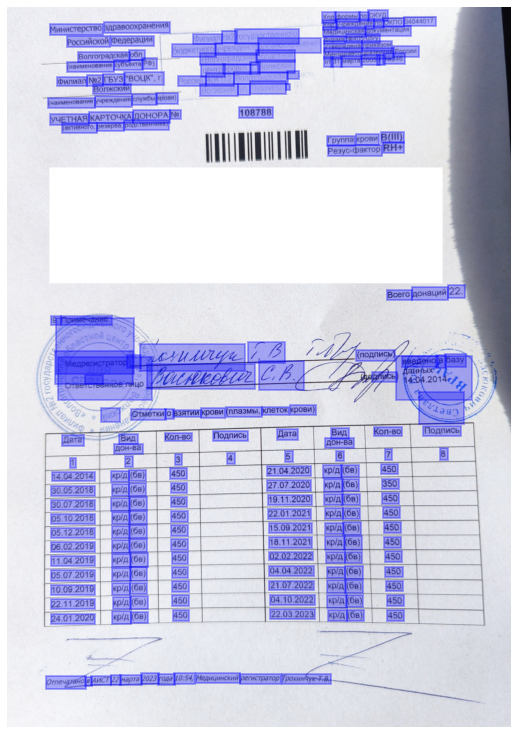


Accuracy for 225629: 0.944


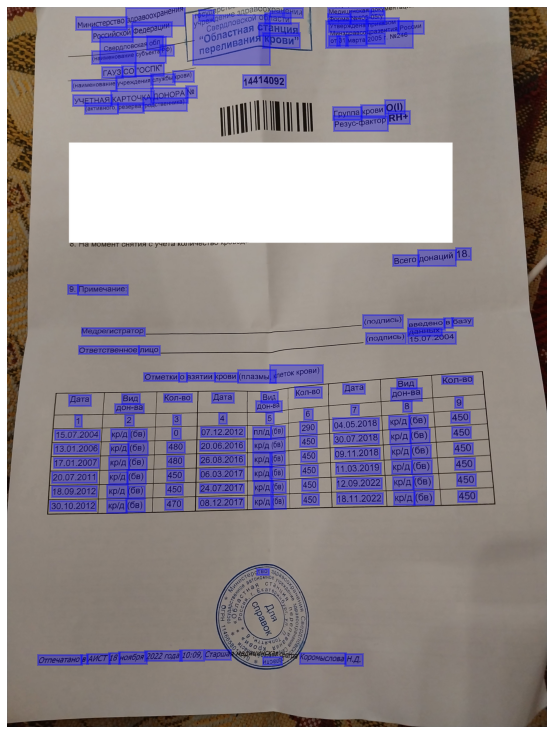


Accuracy for 227414: 0.967


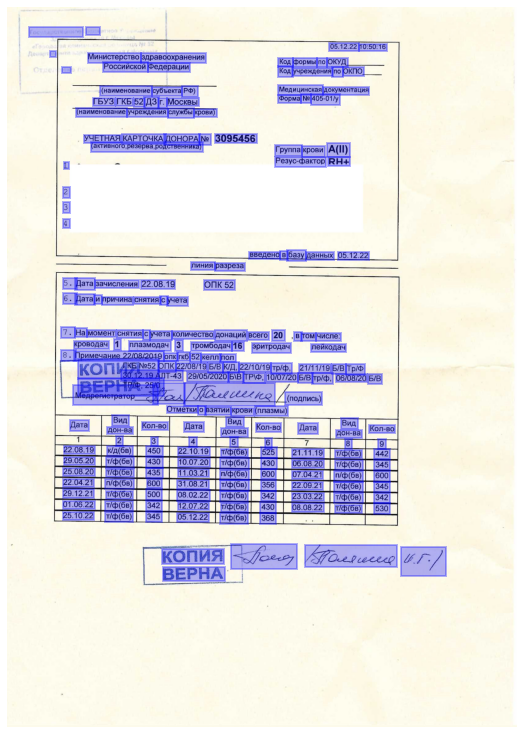


Accuracy for 228963: 0.739


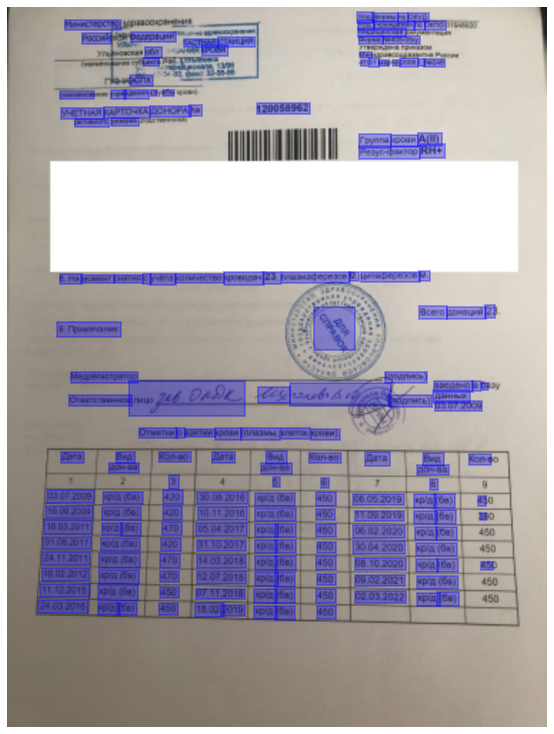


Accuracy for 231820: 0.974


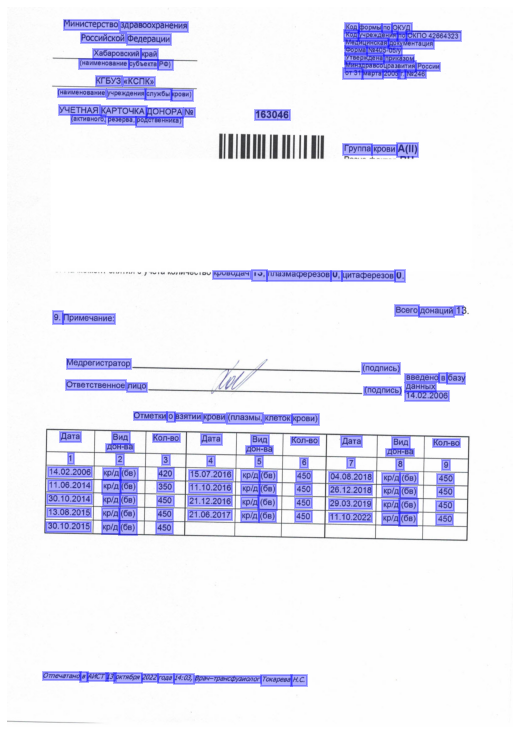


Accuracy for 233749: 0.952


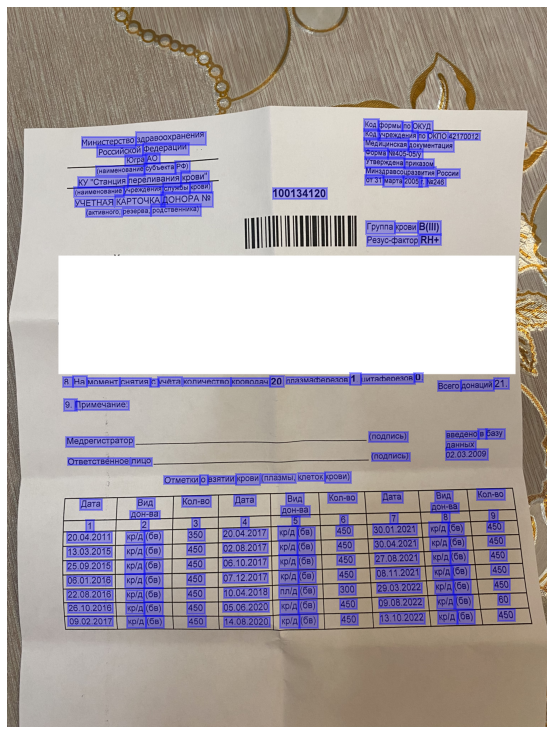


Accuracy for 236000: 0.933


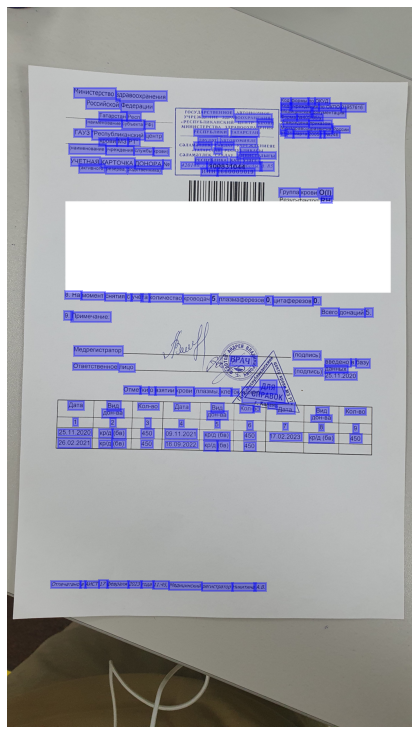


Accuracy for 238716: 0.991


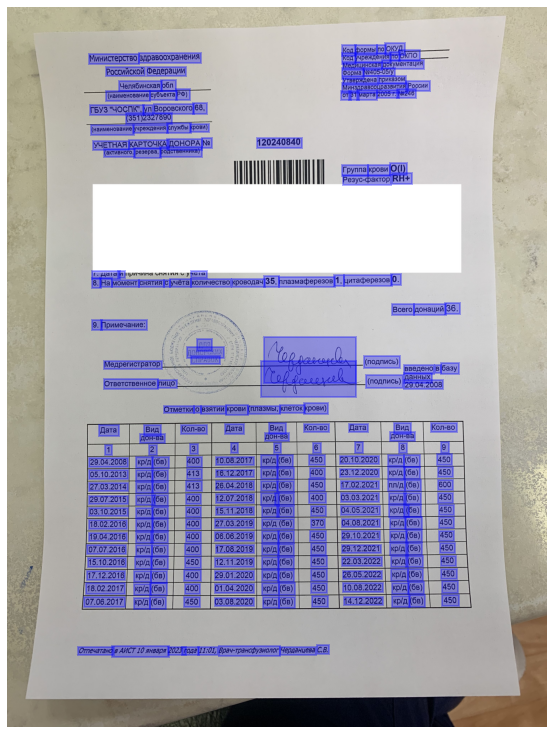


Accuracy for 243478: 0.974


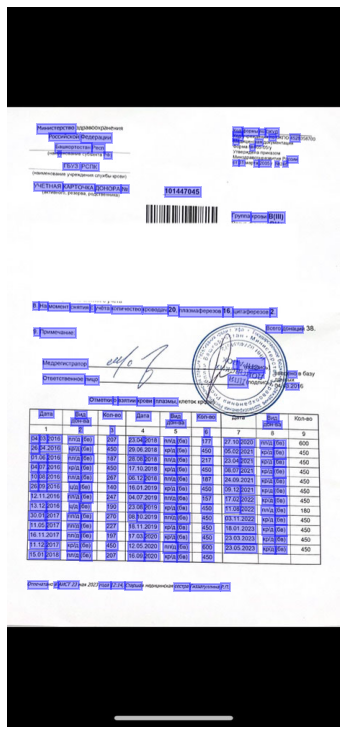


Accuracy for 245365: 0.973


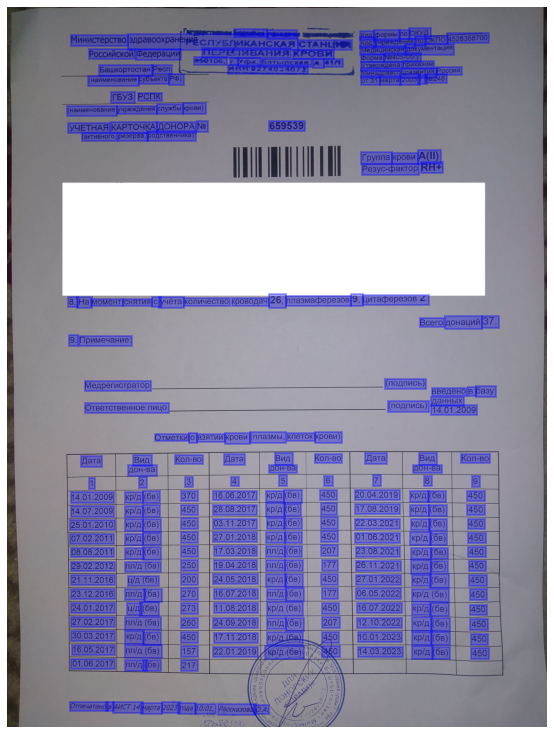


Accuracy for 254586: 1.000


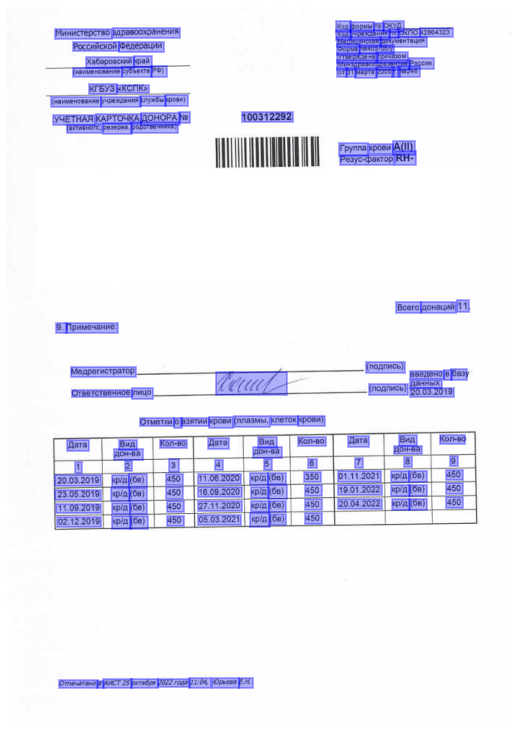


Accuracy for 256578: 0.333


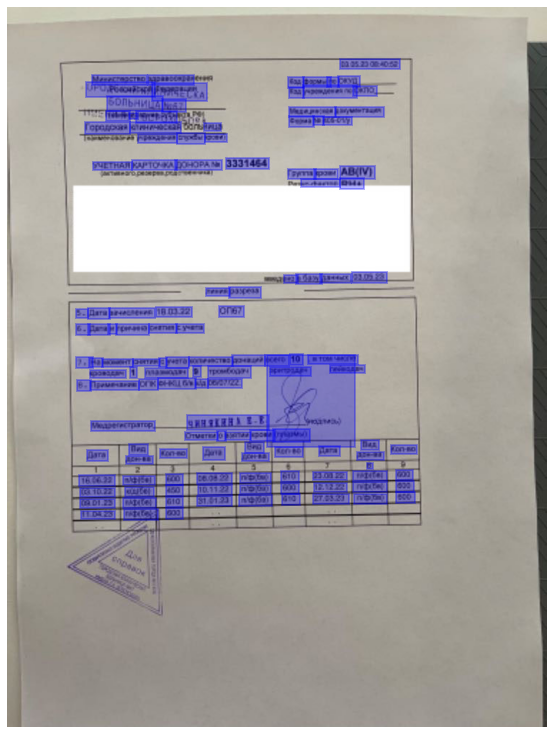


Accuracy for 256838: 0.955


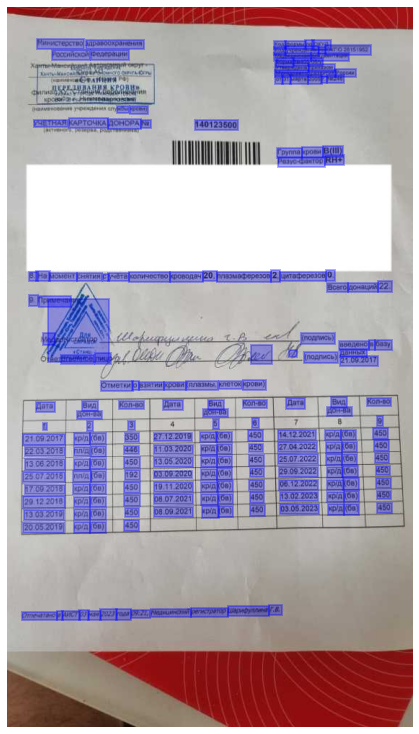

In [10]:
files = [file.split('.')[0] for file in os.listdir(home) \
    if file.endswith('.jpg')]
metric = pd.DataFrame({'file': files, 'accuracy': [0] * len(files)})

for file in os.listdir(home):
    if file.endswith('.jpg'):
        doc = DocumentFile.from_images(os.path.join(home, file))
        result = model(doc)
        jsn = result.pages[0].export()
        lst = []
        for b in jsn['blocks']:
            for l in b['lines']:
                for w in l['words']:
                    lst.append(w['value'])
        
        # получаем датафреймы с предсказаниями и истинными значениями,
        # последний приводим к виду, идентичному первому
        pred_df = table_assembly(lst)
        orig_df = pd.read_csv(os.path.join(home, f'{file.split(".")[0]}.csv'))
        orig_df = orig_df[['Дата донации', 'Класс крови', 'Тип донации']]
        
        # из предыдущих датафреймов оставляем только
        # совпадающие по дате строки для сравнения
        common_dates = set(pred_df['Дата донации'])\
            .intersection(set(orig_df['Дата донации']))
        pred_df_common = pred_df[pred_df['Дата донации']\
            .isin(common_dates)].sort_values(by='Дата донации')
        orig_df_common = orig_df[orig_df['Дата донации']\
            .isin(common_dates)].sort_values(by='Дата донации')

        accuracy = (pred_df_common.values == orig_df_common.values).sum() / orig_df.size
        metric.loc[
            metric['file'] == file.split('.')[0],
            'accuracy'
            ] = round(accuracy, 3)
        
        print(f'Accuracy for {file.split(".")[0]}: {accuracy:.3f}')
        result.show(doc)
        print()

Посмотрим на консолидированные метрики и распределение их значений для тестовых примеров, получим итоговую *accuracy*.

In [11]:
metric

,file,accuracy
0,141899,0.920
1,204119,1.000
2,213950,1.000
3,225629,0.944
4,227414,0.967
5,228963,0.739
6,231820,0.974
7,233749,0.952
8,236000,0.933
9,238716,0.991


In [12]:
px.line(metric, x='file', y='accuracy').update_layout(
    width=1000,
    height=400,
    xaxis_title='Номер файла',
    yaxis_title='Accuracy',
    title=dict(
        text='Распределение accuracy на тестовых примерах',
        x=.5
        )
    )

In [13]:
print(
    'Итоговая accuracy по всем примерам:',
    round(metric.accuracy.mean(), 3)
    )

Итоговая accuracy по всем примерам: 0.91


**Итоговые выводы**

Решение для распознавания информации с фотографий готово, гипотеза о его минимальном качестве подтвердилась.

Результат работы можно назвать достаточно стабильным, но видно, что метод достаточно плохо работает с размытыми изображениями. В остальных случаях *accuracy* не падает ниже 0.92.